### Goals
1. Filter dataset to get 'complex' scenes:
    1. Minimum number of objects
    2. Minimum number of objects from same class
    3. Objects contained in others/Objects interacting with people

In [11]:
import json
import pickle
import os
import copy
from tqdm import tqdm

COCO_PATH = "../../datasets/coco"

### Load datasets
* segmentation annotations (segmentation + bounding boxes)
* caption annotations

In [2]:
with open(os.path.join(COCO_PATH, "annotations/instances_train2017.json"), 'r') as f:
    coco_segmentation = json.load(f)
    
with open(os.path.join(COCO_PATH, "annotations/captions_train2017.json"), 'r') as f:
    coco_captions = json.load(f)    

In [3]:
coco_segmentation.keys()

dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])

In [4]:
coco_segmentation['images'][0]

{'license': 3,
 'file_name': '000000391895.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000391895.jpg',
 'height': 360,
 'width': 640,
 'date_captured': '2013-11-14 11:18:45',
 'flickr_url': 'http://farm9.staticflickr.com/8186/8119368305_4e622c8349_z.jpg',
 'id': 391895}

In [5]:
coco_segmentation['categories'][:-1]

[{'supercategory': 'person', 'id': 1, 'name': 'person'},
 {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'vehicle', 'id': 3, 'name': 'car'},
 {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'},
 {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'},
 {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'},
 {'supercategory': 'vehicle', 'id': 7, 'name': 'train'},
 {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'},
 {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'},
 {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'},
 {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'},
 {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'},
 {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'},
 {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'},
 {'supercategory': 'animal', 'id': 16, 'name': 'bird'},
 {'supercategory': 'animal', 'id': 17, 'name': 'cat'},
 {'supercategory': 'animal', 'id': 18, 'name': 'dog'},

In [6]:
## show all distinct supercategories
list(set([category['supercategory'] for category in coco_segmentation['categories']]))

['accessory',
 'sports',
 'food',
 'person',
 'electronic',
 'appliance',
 'kitchen',
 'outdoor',
 'indoor',
 'animal',
 'vehicle',
 'furniture']

In [12]:
# make a dict mapping category id with name for easy display
category_id_map = {category['id']:category['name'] for category in coco_segmentation['categories']}
with open('filename.pickle', 'wb') as handle:
    pickle.dump(category_id_map, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [8]:
coco_captions.keys()

dict_keys(['info', 'licenses', 'images', 'annotations'])

In [9]:
coco_captions['images'][0]

{'license': 3,
 'file_name': '000000391895.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000391895.jpg',
 'height': 360,
 'width': 640,
 'date_captured': '2013-11-14 11:18:45',
 'flickr_url': 'http://farm9.staticflickr.com/8186/8119368305_4e622c8349_z.jpg',
 'id': 391895}

In [10]:
# mapping to easily find image_id
image_id_map = {image['id']:idx for idx, image in enumerate(coco_segmentation['images'])}

In [11]:
coco_captions['annotations'][1]

{'image_id': 322141,
 'id': 49,
 'caption': 'A room with blue walls and a white sink and door.'}

### map image_ids to indexes in the coco_caption annotations to easily access caption text based on `image_id`

In [12]:
coco_captions_idx = {ann['image_id']:idx for idx, ann in enumerate(coco_captions['annotations'])}
coco_captions_idx

{203564: 246,
 322141: 11,
 16977: 116,
 106140: 117,
 571635: 403,
 301837: 28349,
 315702: 297,
 189634: 235,
 472598: 236,
 162113: 245,
 126657: 28414,
 285421: 219,
 71988: 190,
 193622: 28300,
 459912: 536,
 548498: 28353,
 52087: 149,
 119964: 28321,
 230610: 138,
 226419: 313,
 218026: 28338,
 352538: 340,
 202913: 272,
 202658: 417,
 79472: 28542,
 346071: 359,
 6672: 437,
 419074: 28413,
 382406: 271,
 175948: 381,
 573223: 334,
 402514: 541,
 407286: 192,
 82673: 28588,
 141172: 550,
 104326: 294,
 581177: 112,
 267802: 307,
 208408: 552,
 560591: 265,
 507362: 28471,
 57429: 28393,
 153184: 205,
 571970: 28352,
 133680: 314,
 139011: 315,
 505386: 166,
 107990: 183,
 527510: 547,
 5247: 273,
 107960: 404,
 410627: 28582,
 232223: 507,
 22793: 380,
 436456: 28500,
 368402: 358,
 135161: 354,
 178761: 28510,
 491000: 491,
 538092: 28351,
 205577: 28355,
 508672: 28348,
 334015: 28390,
 27842: 426,
 358606: 512,
 567730: 250,
 61259: 398,
 554037: 399,
 5394: 657,
 455384: 283

## Group annotations by image_id
COCO dataset structure is sort of 'normalized' and has separate lists of annotations and images. 
It is easier to have all images and their metadata under it to filter and get statistics.

In [13]:
image_annotations = {}

for ann in tqdm(coco_segmentation['annotations']):
    if ann['image_id'] not in image_annotations.keys():
        image_annotations[ann['image_id']] = {'annotations': [], 'caption': "", 'distinct_obj': 0, 'instance_count': {}}
    image_annotations[ann['image_id']]['annotations'].append(ann)    
    image_annotations[ann['image_id']]['caption'] = coco_captions['annotations'][coco_captions_idx[ann['image_id']]]["caption"]

100%|███████████████████████████████████████████████████████████████████████| 860001/860001 [00:02<00:00, 421802.50it/s]


In [14]:
# create stats for each image for later use it for filtering
for img_id, img_data in tqdm(image_annotations.items()):
    instance_count = {}
    instance_list = []
    for ann in img_data['annotations']:
        if ann['category_id'] not in instance_count.keys():
            instance_count[ann['category_id']] = 0
        instance_count[ann['category_id']] += 1
        instance_list.append(ann['category_id'])
    img_data['distinct_obj'] = list(set(instance_list))
    img_data['instance_count'] = copy.deepcopy(instance_count)

100%|███████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 125367.55it/s]


* `annotations` has all individual segmentation annotation, with object and category id (`id` and `category_id` respectively). One image can have 0:N segmentation annotation, one for each object.
* `caption` has the caption associated with the image.
* `distinct_obj` has the number of distinct objects in the scene/image, or different `category_id`. Usefull to filter simple and complex scenes based on number of objects, prescence or not of an object
* `instance_count`: count of instances for each object, in a `dict` format `{category_id:number of occurences}`.

In [15]:
image_annotations[list(image_annotations.keys())[0]]

{'annotations': [{'segmentation': [[239.97,
     260.24,
     222.04,
     270.49,
     199.84,
     253.41,
     213.5,
     227.79,
     259.62,
     200.46,
     274.13,
     202.17,
     277.55,
     210.71,
     249.37,
     253.41,
     237.41,
     264.51,
     242.54,
     261.95,
     228.87,
     271.34]],
   'area': 2765.1486500000005,
   'iscrowd': 0,
   'image_id': 558840,
   'bbox': [199.84, 200.46, 77.71, 70.88],
   'category_id': 58,
   'id': 156},
  {'segmentation': [[357.57,
     210.37,
     338.46,
     209.92,
     327.55,
     204.0,
     325.27,
     164.88,
     329.82,
     127.12,
     326.18,
     108.92,
     333.01,
     104.38,
     348.93,
     104.38,
     358.94,
     108.02,
     358.03,
     130.31]],
   'area': 3193.2059999999997,
   'iscrowd': 0,
   'image_id': 558840,
   'bbox': [325.27, 104.38, 33.67, 105.99],
   'category_id': 44,
   'id': 370268},
  {'segmentation': [[170.5,
     171.44,
     168.85,
     149.95,
     169.95,
     138.37,
     1

## Filter dataset

* `Min_N_dist_obj`: Number of distict objects in the image. Ie.: if 3, only an image with at least 3 distict objects will be kept. 
* `objects`: list or dict containing objects that **must** appear in the scene. if `list` then there's no minimum number of instances for the object. if `dict` then the minimum number of appearances should be provided : `{object_id: minimum appearances}`.
* `caption_filter`: filter images that contain a determined list of words in the caption. Currently not used to not condition on the captioning model. Could be used to make sure certain objects are relevant in the scene, specially for main objects

**Removed**
* `Min_N_instances`: Number of instances per category in the image. Ie.: if 3, only an image with at least 3 instances of the same object will be kept.

In [16]:
def filter_complex_images(min_N_dist_obj, objects=None, exclude_objects=None, caption_filter=[]):
    filtered_image_ids = []
    
    for img_id, img_data in tqdm(image_annotations.items()):
        #filter if at least one word shows up in caption
        if caption_filter:
            at_least_one_word = False
            for word in caption_filter:
                if word.lower() in img_data["caption"]["caption"].lower():
                    at_least_one_word = True
                    break
            if not at_least_one_word:
                continue
        
        # at least `min_N_dist_obj` in the scene
        if len(img_data['distinct_obj']) >= min_N_dist_obj:
            # better filter number of instances per object using the `object` parameter
#             max_instances = max(img_data['instance_count'].values())            
#             if max_instances >= min_N_instances:
            
            if exclude_objects is not None:
                if isinstance(exclude_objects, list):
                    objects_found = 0
                    for object_class in exclude_objects:
                        if object_class in img_data['distinct_obj']:
                            objects_found = 1                            
                            continue
                    if objects_found:
                        continue

            if objects is not None:
                # List based, no minimum occurrence of objects
                if isinstance(objects, list):
                    objects_found = 0
                    for object_class in objects:
                        if object_class in img_data['distinct_obj']:
                            objects_found += 1
                    if objects_found == len(objects):
                        filtered_image_ids.append(img_id)
                        
                # dict based, needs to check minimum number of instances of each object
                elif isinstance(objects, dict):
                    objects_found = 0
                    for object_class, min_occurrence in objects.items():
                        if object_class in img_data['distinct_obj']:
                            if img_data['instance_count'][object_class] >= min_occurrence:
                                objects_found += 1
                    if objects_found == len(objects.keys()):
                        filtered_image_ids.append(img_id)
            else:
                filtered_image_ids.append(img_id)            
                
    return filtered_image_ids

## Task 1.
Determine what objects are in the same images containing **person** (category_id=1)

In [17]:
## person id = 1
#filter_words = ["man", "men", "woman", "women" "boy","boys", "girl", "girls", "people", "person"]

filter_objects = {1:1} #filter scenes with at least one person
filtered_ids = filter_complex_images(min_N_dist_obj=3, objects=filter_objects)

100%|██████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 1660458.02it/s]


In [18]:
len(image_annotations.keys())

117266

In [19]:
len(filtered_ids)

41002

### Get list of objects interacting with people

In [43]:
list_of_objects = []
for image_id in filtered_ids:
    list_of_objects.extend(image_annotations[image_id]["distinct_obj"])
list_of_objects = list(set(list_of_objects))
len(list_of_objects)

80

In [44]:
for obj_id in list_of_objects:
    object_details = [(category["name"],category["supercategory"]) for category in coco_segmentation["categories"] if category["id"] == obj_id]
    print(obj_id, object_details[0])

1 ('person', 'person')
2 ('bicycle', 'vehicle')
3 ('car', 'vehicle')
4 ('motorcycle', 'vehicle')
5 ('airplane', 'vehicle')
6 ('bus', 'vehicle')
7 ('train', 'vehicle')
8 ('truck', 'vehicle')
9 ('boat', 'vehicle')
10 ('traffic light', 'outdoor')
11 ('fire hydrant', 'outdoor')
13 ('stop sign', 'outdoor')
14 ('parking meter', 'outdoor')
15 ('bench', 'outdoor')
16 ('bird', 'animal')
17 ('cat', 'animal')
18 ('dog', 'animal')
19 ('horse', 'animal')
20 ('sheep', 'animal')
21 ('cow', 'animal')
22 ('elephant', 'animal')
23 ('bear', 'animal')
24 ('zebra', 'animal')
25 ('giraffe', 'animal')
27 ('backpack', 'accessory')
28 ('umbrella', 'accessory')
31 ('handbag', 'accessory')
32 ('tie', 'accessory')
33 ('suitcase', 'accessory')
34 ('frisbee', 'sports')
35 ('skis', 'sports')
36 ('snowboard', 'sports')
37 ('sports ball', 'sports')
38 ('kite', 'sports')
39 ('baseball bat', 'sports')
40 ('baseball glove', 'sports')
41 ('skateboard', 'sports')
42 ('surfboard', 'sports')
43 ('tennis racket', 'sports')
44

## Filter again with a list of secondary objects
It will generate a list of images with the tuple `(person, SECONDARY_OBJECT)`

In [45]:
# person id = 1
# subcategory = 'accessory'
# 27 ('backpack', 'accessory')
# 28 ('umbrella', 'accessory')
# 31 ('handbag', 'accessory')
# 32 ('tie', 'accessory')
# 33 ('suitcase', 'accessory')
object_ids_images = {27: [], 28: [], 31: [], 32: [], 33: []}
for obj_id in object_ids_images:
    fixed_classes = {1:1}
    fixed_classes[obj_id] = 1
    object_image_list = filter_complex_images(4, objects=fixed_classes)
    object_ids_images[obj_id] = object_image_list

100%|██████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 1872313.45it/s]


In [46]:
print("Number of instances per tuple")
for category_id, image_list in object_ids_images.items():
    print(f"{(1,category_id)} {('person', category_id_map[category_id])}: {len(image_list)}")

Number of instances per tuple
(1, 27) ('person', 'backpack'): 3524
(1, 28) ('person', 'umbrella'): 2089
(1, 31) ('person', 'handbag'): 4890
(1, 32) ('person', 'tie'): 1543
(1, 33) ('person', 'suitcase'): 1048


In [47]:
## generate dataset
# PS: there are overlapping images between different tuples

filtered_task1_data = {}
for category_id, image_list in object_ids_images.items():
    filtered_task1_data[category_id] = []
    for image_id in image_list:
        image_data = coco_segmentation['images'][image_id_map[image_id]]        
        filtered_task1_data[category_id].append({'annotations': image_annotations[image_id], 'image': image_data})    

In [48]:
filtered_task1_data.keys()

dict_keys([27, 28, 31, 32, 33])

In [49]:
filtered_task1_data[33][:10]

[{'annotations': {'annotations': [{'segmentation': [[220.84,
       196.57,
       239.3,
       178.66,
       253.23,
       168.21,
       255.22,
       159.26,
       263.17,
       162.24,
       272.13,
       174.18,
       258.7,
       195.58,
       256.71,
       199.06,
       257.21,
       201.55,
       251.24,
       202.04,
       249.25,
       195.08,
       236.81,
       204.03,
       217.41,
       203.04,
       224.37,
       193.59]],
     'area': 1124.4272499999997,
     'iscrowd': 0,
     'image_id': 205573,
     'bbox': [217.41, 159.26, 54.72, 44.77],
     'category_id': 18,
     'id': 5637},
    {'segmentation': [[108.84,
       215.87,
       96.87,
       277.91,
       115.37,
       336.69,
       134.97,
       358.46,
       166.53,
       359.55,
       183.95,
       336.69,
       192.65,
       325.8,
       211.16,
       320.36,
       206.8,
       281.18,
       183.95,
       260.5,
       170.88,
       225.67,
       163.27,
       203.9,

In [50]:
# save processed dataset in a json file
with open('task1_person_accessory_data.json', "w") as f:
    json.dump(filtered_task1_data, f)

## Task 2.
Determine what objects are in the same images containing **?** (category_id=?)

In [51]:
## analyzing images without person
obj_count = {}
for img_id, img_data in tqdm(image_annotations.items()):
    if 1 not in img_data['distinct_obj'] and len(img_data['distinct_obj'])>2:
        for obj in img_data['distinct_obj']:
            if obj not in obj_count:
                obj_count[obj] = 0
            obj_count[obj] += 1

100%|██████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 1932617.62it/s]


In [52]:
sorted_obj_count = sorted(obj_count.items(), key=lambda x: x[1], reverse=True)
for obj_id, count in sorted_obj_count[:10]:
    print(f"{obj_id} {category_id_map[obj_id]}: {count}")

67 dining table: 5209
62 chair: 4159
47 cup: 3990
51 bowl: 3705
44 bottle: 3393
84 book: 2665
72 tv: 2356
81 sink: 2216
64 potted plant: 1920
63 couch: 1907


In [53]:
#filter scenes with at least one dining table
filtered_dining_table = filter_complex_images(min_N_dist_obj=3, objects={67:1}, exclude_objects=[1])

100%|██████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 1963956.16it/s]


In [54]:
len(filtered_ids)

41002

In [55]:
len(filtered_dining_table)

5209

### Get list of objects interacting with dining table

In [56]:
list_of_objects = []
for image_id in filtered_dining_table:
    list_of_objects.extend(image_annotations[image_id]["distinct_obj"])
list_of_objects = list(set(list_of_objects))
len(list_of_objects)

75

In [57]:
for obj_id in list_of_objects:
    object_details = [(category["name"],category["supercategory"]) for category in coco_segmentation["categories"] if category["id"] == obj_id]
    print(obj_id, object_details[0])

2 ('bicycle', 'vehicle')
3 ('car', 'vehicle')
4 ('motorcycle', 'vehicle')
5 ('airplane', 'vehicle')
6 ('bus', 'vehicle')
7 ('train', 'vehicle')
8 ('truck', 'vehicle')
9 ('boat', 'vehicle')
10 ('traffic light', 'outdoor')
11 ('fire hydrant', 'outdoor')
13 ('stop sign', 'outdoor')
14 ('parking meter', 'outdoor')
15 ('bench', 'outdoor')
16 ('bird', 'animal')
17 ('cat', 'animal')
18 ('dog', 'animal')
19 ('horse', 'animal')
20 ('sheep', 'animal')
21 ('cow', 'animal')
22 ('elephant', 'animal')
23 ('bear', 'animal')
25 ('giraffe', 'animal')
27 ('backpack', 'accessory')
28 ('umbrella', 'accessory')
31 ('handbag', 'accessory')
32 ('tie', 'accessory')
33 ('suitcase', 'accessory')
34 ('frisbee', 'sports')
35 ('skis', 'sports')
37 ('sports ball', 'sports')
38 ('kite', 'sports')
39 ('baseball bat', 'sports')
41 ('skateboard', 'sports')
42 ('surfboard', 'sports')
44 ('bottle', 'kitchen')
46 ('wine glass', 'kitchen')
47 ('cup', 'kitchen')
48 ('fork', 'kitchen')
49 ('knife', 'kitchen')
50 ('spoon', 'k

## Filter again with a list of secondary objects
It will generate a list of images with the tuple `(dining table, SECONDARY_OBJECT)`
* Filter tuples with > 1000 images

In [62]:
# person id = 1
# subcategory = 'accessory'
# 27 ('backpack', 'accessory')
# 28 ('umbrella', 'accessory')
# 31 ('handbag', 'accessory')
# 32 ('tie', 'accessory')
# 33 ('suitcase', 'accessory')
MIN_SAMPLE_PER_TUPLE = 1000
object_ids_images = {}
for obj_id in list_of_objects:
    fixed_classes = {67:1}
    fixed_classes[obj_id] = 1
    object_image_list = filter_complex_images(3, objects=fixed_classes, exclude_objects=[1])
    if len(object_image_list) >= MIN_SAMPLE_PER_TUPLE:
        object_ids_images[obj_id] = object_image_list

100%|██████████████████████████████████████████████████████████████████████| 117266/117266 [00:00<00:00, 1905240.45it/s]


In [63]:
print("Number of instances per tuple")
for category_id, objects_list in object_ids_images.items():
    print(f"{(67,category_id)} {('dining table', category_id_map[category_id])}: {len(objects_list)}")

Number of instances per tuple
(67, 44) ('dining table', 'bottle'): 1060
(67, 47) ('dining table', 'cup'): 1919
(67, 48) ('dining table', 'fork'): 1191
(67, 49) ('dining table', 'knife'): 1066
(67, 51) ('dining table', 'bowl'): 1793
(67, 62) ('dining table', 'chair'): 1898
(67, 67) ('dining table', 'dining table'): 5209


In [64]:
## generate dataset
# PS: there are overlapping images between different tuples

filtered_task2_data = {}
for category_id, image_list in object_ids_images.items():
    filtered_task2_data[category_id] = []
    for image_id in image_list:
        image_data = coco_segmentation['images'][image_id_map[image_id]]        
        filtered_task2_data[category_id].append({'annotations': image_annotations[image_id], 'image': image_data})    

In [65]:
filtered_task2_data.keys()

dict_keys([44, 47, 48, 49, 51, 62, 67])

In [72]:
filtered_task2_data[44][0]

{'annotations': {'annotations': [{'segmentation': [[299.07,
      261.11,
      299.07,
      261.11,
      299.07,
      261.11,
      306.31,
      288.84,
      307.51,
      299.7,
      340.68,
      306.33,
      357.56,
      288.84,
      358.17,
      284.62,
      369.62,
      254.47,
      353.34,
      257.49,
      355.15,
      245.43,
      364.8,
      237.59,
      383.49,
      238.79,
      380.48,
      221.91,
      380.48,
      203.22,
      385.9,
      186.33,
      396.76,
      176.69,
      406.41,
      159.2,
      409.42,
      144.73,
      400.38,
      140.51,
      390.73,
      145.33,
      385.3,
      139.3,
      374.45,
      163.42,
      370.23,
      165.23,
      367.81,
      147.14,
      355.75,
      127.24,
      347.91,
      118.19,
      344.9,
      116.99,
      338.87,
      139.3,
      331.63,
      154.37,
      319.57,
      166.43,
      311.13,
      139.9,
      289.42,
      124.83,
      268.32,
      124.83,
      277.9

In [68]:
# save processed dataset in a json file
with open('task2_dining_objects_data.json', "w") as f:
    json.dump(filtered_task2_data, f)

### display images

In [70]:
from PIL import Image, ImageDraw
import numpy as np
import random as r
import matplotlib.pyplot as plt

In [76]:
sample_data = filtered_task2_data[44][0]

# sample_id = filtered_ids[r.randint(0, len(filtered_ids))]
sample_id = sample_data['image']['id']
sample_id

78260

In [74]:
# sample_id = 558840

In [75]:
# img_data = None
# for img in coco_segmentation['images']:
#     if img['id'] == sample_id:
#         img_data = img
# img_data

(640, 425)


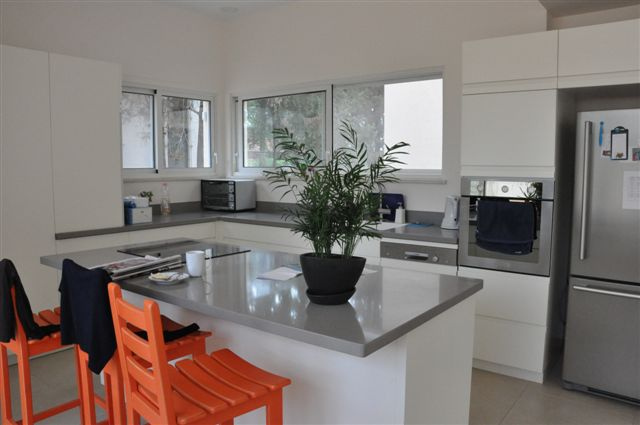

In [77]:
img = Image.open(os.path.join(COCO_PATH, 'train2017', sample_data['image']['file_name'])).convert('RGB')
print(img.size)
img

In [78]:
def add_annotations(img: Image, annotations: list):
    img_draw = ImageDraw.Draw(img)  
    for ann in annotations:
        #seg = np.array(ann['segmentation'][0], dtype='int')
        if isinstance(ann['segmentation'], list):
            seg = ann['segmentation'][0]
            img_draw.polygon(ann['segmentation'][0], fill ="#eeeeff", outline ="red")
    return img

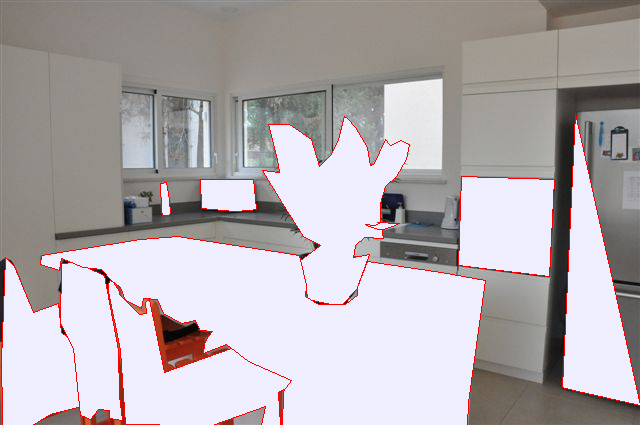

In [80]:
add_annotations(img, sample_data['annotations']['annotations'])
# add_annotations(img, image_annotations[sample_id]['annotations'])

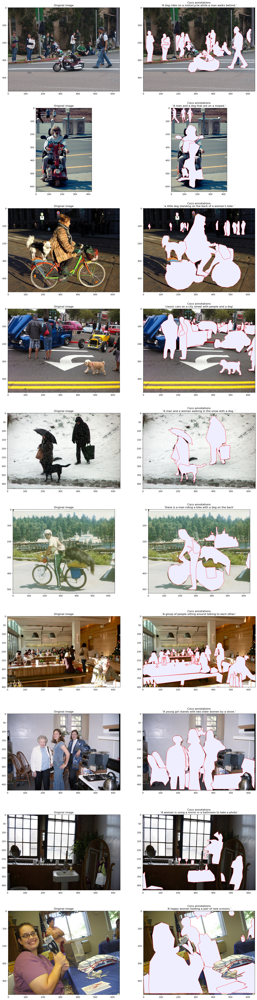

In [84]:
fig, axs = plt.subplots(nrows=10, ncols=2, figsize=(20, 80))
for idx, sample_id_ in enumerate(filtered_ids):
    img_data = None
    for img in coco_data['images']:
        if img['id'] == sample_id_:
            img_data = img
    img = Image.open(os.path.join(COCO_PATH, 'train2017', img_data['file_name'])).convert('RGB')
    axs[idx, 0].set_title("Original image")
    axs[idx, 0].imshow(img)
    ann_img = add_annotations(copy.deepcopy(img), image_annotations[sample_id_]['annotations'])
    caption = coco_captions['annotations'][coco_captions_idx[sample_id_]]["caption"]
    axs[idx, 1].set_title(f"Coco annotations\n'{caption}'")
    axs[idx, 1].imshow(ann_img)
    
    if idx >= 9:
        break

In [28]:
with open('sample_coco_ids_person_plus_object_1.json', "w") as f:
    json.dump(object_ids_images, f)

In [35]:
np.save('sample_coco_ids_4_2_person', filtered_ids)
#np.save('sample_coco_ids_5_4', filtered_ids)